In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

#!/usr/bin/env python3

seed_value=42

import os
import sys
import random as rn

from fastai.vision import *
from fastai.metrics import error_rate

import shutil

# -----------------------------
#from google.colab import drive
#from os import walk

#drive.mount('/content/gdrive')
# -----------------------------


# -----------------------------
# Make everything deterministic
os.environ['PYTHONHASHSEED']=str(seed_value)
np.random.seed(seed_value)
rn.seed(seed_value)

import torch

torch.manual_seed(seed_value)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
# -----------------------------

from subprocess import check_output
nvidia_smi_ = [0, 0]

def nvidia_smi(nvidia_smi_):
    old_nvidia_smi_ = nvidia_smi_[1]
    nvidia_smi_now  = int(check_output(['nvidia-smi', '--query-gpu=memory.used', '--format=csv,nounits,noheader']))
    nvidia_smi_[0]  = nvidia_smi_now
    nvidia_smi_[1]  = nvidia_smi_now - old_nvidia_smi_
    return nvidia_smi_ 

print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))

torch.cuda.empty_cache()

from datetime import datetime
currtime = datetime.now().strftime('%Y-%m-%d_%H.%M.%S')

caddy_gestures_dataset_dir   = 'all-scenarios-split-cristal-clear-vs-cloudy-and-dark'
caddy_gestures_dataset_fname = caddy_gestures_dataset_dir + '.zip'
caddy_gestures_dataset_url   = 'http://caddy-underwater-datasets.ge.issia.cnr.it/assets/caddy-gestures-TMP/' + caddy_gestures_dataset_fname

nvidia-smi memory usage/increment: [11, 11]


In [2]:
!wget "$caddy_gestures_dataset_url"

--2019-09-16 14:21:42--  http://caddy-underwater-datasets.ge.issia.cnr.it/assets/caddy-gestures-TMP/all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
Resolving caddy-underwater-datasets.ge.issia.cnr.it (caddy-underwater-datasets.ge.issia.cnr.it)... 150.145.4.194
Connecting to caddy-underwater-datasets.ge.issia.cnr.it (caddy-underwater-datasets.ge.issia.cnr.it)|150.145.4.194|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1540347170 (1.4G) [application/zip]
Saving to: ‘all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip’

all-scenarios-split 100%[===================>]   1.43G  10.6MB/s    in 2m 22s  

2019-09-16 14:24:06 (10.4 MB/s) - ‘all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip’ saved [1540347170/1540347170]



In [3]:
!md5sum "$caddy_gestures_dataset_fname"
print('88dd6fbfc8176d6845dd0f55f95c0c5b  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip')

88dd6fbfc8176d6845dd0f55f95c0c5b  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
88dd6fbfc8176d6845dd0f55f95c0c5b  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip


In [4]:
!unzip "$caddy_gestures_dataset_fname"
!ls

Output hidden; open in https://colab.research.google.com to view.

# Splitting the dataset

![alt text](https://i.ibb.co/MGCWyCf/image.png)

In [0]:
models_specs = {}
models_specs['A'] = {}
models_specs['B'] = {}
models_specs['C'] = {}
models_specs['F'] = {}

scenarios = ['biograd-A', 'biograd-B', 'biograd-C', 'genova-A', 'brodarski-A', 'brodarski-B', 'brodarski-C', 'brodarski-D']

models_specs['A']['train'] = ['biograd-A', 'biograd-B']
models_specs['B']['train'] = ['genova-A']
models_specs['C']['train'] = ['brodarski-A', 'brodarski-C']
models_specs['F']['train'] = scenarios

split = [80, 20]             # test sets are all the scenarios picked up one by one
overall_split = [70, 20, 10] # except the "overall one" that is the union of all of them with this split (not a random split because the frames come from a video)

In [0]:
#curr_model = 'A'
#curr_model = 'B'
#curr_model = 'C'
curr_model = 'F'

In [7]:
path = Path(caddy_gestures_dataset_dir) / 'all-scenarios'
path.ls()

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/exceptions.txt'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm'),
 PosixPa

In [8]:
def find_all_dirs(directory: Path):   
    dir_list = [] # A list for storing directories existing in the provided path

    for x in directory.iterdir():
        if x.is_dir():
           dir_list.append(x)

    return dir_list
  
dir_list = find_all_dirs(path)

dir_list

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five'),
 PosixPath('all-sc

In [9]:
def find_all_files(directory: Path):   
    file_list = [] # A list for storing files existing in the provided path

    for x in directory.iterdir():
        if x.is_file():
           file_list.append(x)

    return file_list
  
for d in dir_list:
    subdir_list = find_all_dirs(d)
    print(subdir_list)                 # "crystal-clear", "cloudy-and-dark"
    print(d.stem, d)                   # "up", "all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up"
    for sd in subdir_list:
        file_list = find_all_files(sd)
        print(file_list)

Output hidden; open in https://colab.research.google.com to view.

In [0]:
from sklearn.model_selection import train_test_split

split_dataset_dir = 'caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-' + curr_model
split_path = Path(split_dataset_dir)
split_path.mkdir(exist_ok=True)
split_path.ls()

dataset_subdirs = ['train', 'valid', 'test']
all_dataset = {}

for ds in dataset_subdirs:
    (split_path / ds).mkdir(exist_ok=True)
    all_dataset[ds] = {}

file_lists = []

# Create train+valid sets and test sets
Create train+valid dataset and perform the split according to {split}
Create the test sets (8 + the "overall" one) using images that don't match training set requirements

In [32]:
import re

train_valid = {}
test        = {}

for sc in scenarios:               # biograd-A, biograd-B, ... , genova-A
    test[sc] = {}
test['overall'] = {}               # Behold! The 'overall' test set! Keep in mind that no training image can end up being also in the test set!

for sc in scenarios + ['overall']:
    for d in dir_list:             # gesture name: 'one', 'two', 'up', 'down', 'mosaic', ...
        train_valid[d.stem] = []
        test[sc][d.stem] = []

#print(test)
#print(scenarios)
    
for d in dir_list:
    '''                                 # use this to debug. "five" has less than 100 elements
    if d.stem != 'two':
        continue
    '''

    for ds in ['train', 'valid']:       # not test because test dir has a different structure to also account for different scenarios
        (split_path / ds / d.stem).mkdir(exist_ok=True)

    subdir_list = find_all_dirs(d)
    #print(subdir_list)                 # "crystal-clear", "cloudy-and-dark"
    print(80*'-')
    #print(d.stem, d)                   # "up", "all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up"
    print(d.stem)
    print(80*'-')
    
    for sd in subdir_list:
        file_list = find_all_files(sd)
        print(file_list[:2])
        for f in file_list:
            if curr_model != 'F':
                scenarios_regex = ''
                for scenario in models_specs[curr_model]['train']:
                    scenarios_regex += scenario + '|'                   # build a regexp with all the scenarios that will constitute the train+valid set (to decide with just 1 if)
                #print(scenario, f.stem, (scenario in f.stem))
                scenarios_regex = scenarios_regex[:-1]
                found = re.search(scenarios_regex, f.stem) 
                #print(f'Looking for: {scenarios_regex} in {f.stem}')
                if found:                                               # if the regexp with 'biograd-A|biograd-B' matches -> training set, else test set
                    train_valid[d.stem].append(f)
                    #print(f'Found: {scenarios_regex} in {f.stem}')
                else:
                    sc_regex = '.*___(.*)_[0-9]*_.*'                    # ok, but which test set? we have 8 of them! extract the scenario from the filename and...
                    sc = re.sub(sc_regex, '\\1', f.stem)
                    if sc in scenarios:
                        #print(f'Found test scenario {sc}')
                        test[sc][d.stem].append(f)                      # ...add to the proper list
                        #test['overall'][d.stem].append(f)              # and don't forget the overall scenario! -- this is wrong, the 'overall' scenario has zero test set in model-F

            #--------------------------------------------------------
            #--------------------------------------------------------
            #--------------------------------------------------------
            else:
                sc_regex = '.*___(.*)_[0-9]*_.*'                    # ok, but which test set? we have 8 of them! extract the scenario from the filename and...
                sc = re.sub(sc_regex, '\\1', f.stem)
                if '100' in str(f):
                    print(f'[{d.stem}] Found file belonging to test scenario {sc}')
                test[sc][d.stem].append(f)                          # add everything that belongs to a given scenario to the proper test set,
                                                                    # later we'll trim the list, keeping just the last 10% in the test set and adding the rest to train/valid sets
            #--------------------------------------------------------
            #--------------------------------------------------------
            #--------------------------------------------------------
                    
        #print(f'Found {len(train_valid[d.stem])} images in subdirectory "{sd.name}" matching training set requirements ({models_specs[curr_model]["train"]}) for model {curr_model}')

    if curr_model != 'F':
        print(f'[{d.stem}] Splitting train+valid set with {len(train_valid[d.stem])} images according to split {split} in a non-random (i.e. sequential) way')
        train_valid[d.stem].sort()
        print(f'Train+Valid: {train_valid[d.stem][:2]}')
    
        sz = int(len(train_valid[d.stem]) * split[0] / 100)
        train = train_valid[d.stem][:sz]
        valid = train_valid[d.stem][sz:]
        print(f'Train: {len(train)} - Valid: {len(valid)} - sz: {sz}')
    
        print(f'Train: {train[:2]}')
        print(f'Valid: {valid[:2]}')
    else:
        #--------------------------------------------------------
        #--------------------------------------------------------
        #--------------------------------------------------------
        
        # overall_split = [70, 20, 10]
        # https://stackoverflow.com/questions/38250710/how-to-split-data-into-3-sets-train-validation-and-test/38251213#38251213
        #train, valid, test = np.split(df.sample(frac=1), [int(overall_split[0]/100*len(df)), int((overall_split[0]+overall_split[1])/100*len(df))])
        
        sz_tr = 0
        #sz_test = 0
        #for sc in scenarios + ['overall']:
        for sc in scenarios:
            test[sc][d.stem].sort()
            
            print(f'[{sc}][{d.stem}] Splitting test set with {len(test[sc][d.stem])} images according to split {overall_split} in a sequential way')
            print(f'[{sc}][{d.stem}] before split: {test[sc][d.stem][:2]} -> {test[sc][d.stem][-2:]}')
            sz                  = int(len(test[sc][d.stem]) * (overall_split[0]+overall_split[1]) / 100) # 70 + 20 = train + valid
            sz_tr              += int(len(test[sc][d.stem]) * (overall_split[0]) / 100)                  # 70 = train
            train_valid[d.stem] = train_valid[d.stem] + test[sc][d.stem][:sz]               # actually we don't care if train+valid images are divided by scenario, they're always the same for all the test sets
            test[sc][d.stem]    = test[sc][d.stem][sz:]
            #sz_test            += len(test[sc][d.stem])
            print(f'[{sc}][{d.stem}] Cumulative train+valid: {len(train_valid[d.stem])} - Test: {len(test[sc][d.stem])} - sz: {sz} - sz_tr: {sz_tr}')
            
            # Ok, from now on we should be in the same situation as before: train+valid = 70+20, test = 10


        print(f'[{d.stem}] Splitting train+valid set with {len(train_valid[d.stem])} images according to split {overall_split[:-1]} in a non-random (i.e. sequential) way')
        train_valid[d.stem].sort()
        print(f'[{d.stem}] before split: {train_valid[d.stem][:2]} -> {train_valid[d.stem][-2:]}')
    
        #sz = int(len(train_valid[d.stem]) * overall_split[0] / 100)
        train = train_valid[d.stem][:sz_tr]
        valid = train_valid[d.stem][sz_tr:]
        #print(f'Train: {len(train)} - Valid: {len(valid)} - sz_tr: {sz_tr} - sz_test: {sz_test}')
        print(f'Train: {len(train)} - Valid: {len(valid)} - sz_tr: {sz_tr}')                # there's a bit of rounding error here, given that the split is done on a per scenario basis
        for sc in scenarios:
            print(f'[{sc}] Test: {len(test[sc][d.stem])}')
    
        print(f'Train: {train[:2]}')
        print(f'Valid: {valid[:2]}')
        #--------------------------------------------------------
        #--------------------------------------------------------
        #--------------------------------------------------------

print(f'Copying everything in test[all_scenarios] to test[overall]...')

for d in dir_list:
        for sc in scenarios:
            test['overall'][d.stem] = test['overall'][d.stem] + test[sc][d.stem]
        print(f'[overall] Test[overall]: {len(test["overall"][d.stem])}')
    

#print(f'{len(train_valid[d.stem])} - Train+Valid: {train_valid[d.stem]}')

stemmed_test = {}

for sc in scenarios + ['overall']:
    stemmed_test[sc] = {}
    for d in dir_list:             # gesture name: 'one', 'two', 'up', 'down', 'mosaic', ...
        test[sc][d.stem].sort()
        stemmer = lambda x: x.stem
        stemmed_list = list(map(stemmer, test[sc][d.stem]))
        #print(f'Scenario {sc} - gesture {d.stem} - {len(test[sc][d.stem])} - Test: {test[sc][d.stem][:2]}')
        print(f'Scenario {sc} - gesture {d.stem} - {len(test[sc][d.stem])} - Test: {stemmed_list[:2]}...{stemmed_list[-2:]}')
        
        stemmed_test[sc][d.stem] = stemmed_list

--------------------------------------------------------------------------------
three
--------------------------------------------------------------------------------
[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01725_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_00651_left.jpg')]
[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00045_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00387_left.jpg')]
[three] Found file belonging to test scenario biograd-C
[three] Found file belonging to test scenario biograd-C
[three] Found file belonging to test scenario biograd-C
[three] Found file belonging to test scenario brodarski-C
[three] Found file belonging to test scenario biograd-C
[three

# Export train/valid/test sets as CSV and pickle file

In [33]:
import pickle
train_valid_df = pd.DataFrame.from_dict(train_valid, orient='index')

print(train_valid_df)
train_valid_df.to_csv('/content/train_valid-df-model-' + curr_model + '.csv')

with open('/content/train_valid-df-model-' + curr_model + '.pkl', 'wb') as handle:
    pickle.dump(train_valid, handle, protocol=pickle.HIGHEST_PROTOCOL)


test_df = pd.DataFrame.from_dict(test)

print(test_df)
test_df.to_csv('/content/test-df-model-' + curr_model + '.csv')

with open('/content/test-df-model-' + curr_model + '.pkl', 'wb') as handle:
    pickle.dump(test, handle, protocol=pickle.HIGHEST_PROTOCOL)

                                                            0     ...                                               3271
three          all-scenarios-split-cristal-clear-vs-cloudy-an...  ...                                               None
backwards      all-scenarios-split-cristal-clear-vs-cloudy-an...  ...                                               None
boat           all-scenarios-split-cristal-clear-vs-cloudy-an...  ...                                               None
carry          all-scenarios-split-cristal-clear-vs-cloudy-an...  ...                                               None
four           all-scenarios-split-cristal-clear-vs-cloudy-an...  ...                                               None
two            all-scenarios-split-cristal-clear-vs-cloudy-an...  ...                                               None
down           all-scenarios-split-cristal-clear-vs-cloudy-an...  ...                                               None
num_delimiter  all-scenarios-spl

# Now perform the actual copy



In [34]:
for d in dir_list:
    sz = int(len(train_valid[d.stem]) * split[0] / 100)
    train = train_valid[d.stem][:sz]
    valid = train_valid[d.stem][sz:]
    print(f'Train: {len(train)} - Valid: {len(valid)} - sz: {sz}')
    
    dst_path = split_path / 'train' / d.stem
    for file in train:
        #print(f'Copying {file} to {dst_path}')
        shutil.copy(file, dst_path)
    dst_path = split_path / 'valid' / d.stem
    for file in valid:
        #print(f'Copying {file} to {dst_path}')
        shutil.copy(file, dst_path)


Train: 557 - Valid: 140 - sz: 557
Train: 806 - Valid: 202 - sz: 806
Train: 528 - Valid: 132 - sz: 528
Train: 1030 - Valid: 258 - sz: 1030
Train: 337 - Valid: 85 - sz: 337
Train: 578 - Valid: 145 - sz: 578
Train: 664 - Valid: 166 - sz: 664
Train: 1425 - Valid: 357 - sz: 1425
Train: 2617 - Valid: 655 - sz: 2617
Train: 1895 - Valid: 474 - sz: 1895
Train: 68 - Valid: 17 - sz: 68
Train: 505 - Valid: 127 - sz: 505
Train: 323 - Valid: 81 - sz: 323
Train: 231 - Valid: 58 - sz: 231
Train: 373 - Valid: 94 - sz: 373
Train: 1330 - Valid: 333 - sz: 1330


... and for the test sets

In [35]:
for sc in scenarios + ['overall']:
    (split_path / 'test' / sc).mkdir(exist_ok=True)
    for d in dir_list:             # gesture name: 'one', 'two', 'up', 'down', 'mosaic', ...
        test_dst_path = split_path / 'test' / sc / d.stem
        test_dst_path.mkdir(exist_ok=True)
        for file in test[sc][d.stem]:
            if '100' in str(file):
                print(f'Scenario {sc} - copying {file} to {test_dst_path}')
            shutil.copy(file, test_dst_path)

Scenario genova-A - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_left.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/genova-A/down
Scenario genova-A - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_right.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/genova-A/down
Scenario overall - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_left.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/overall/down
Scenario overall - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_right.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/overall/down


# Verify what has been copied

For train and valid sets...

In [36]:
for d in dir_list:                             # 'up', 'down', 'carry'
    for ds in ['train', 'valid']:              # not test
        dst_path = split_path / ds / d.stem
        print(f'{len(dst_path.ls())} - {dst_path.ls()}')

Output hidden; open in https://colab.research.google.com to view.

... and for the test sets

In [37]:
for sc in scenarios + ['overall']:
    for d in dir_list:                             # 'up', 'down', 'carry'
        test_dst_path = split_path / 'test' / sc / d.stem
        print(f'{len(test_dst_path.ls())} - {test_dst_path} - {test_dst_path.ls()[:2]}')

10 - caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/three - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/three/three___biograd-A_00524_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/three/three___biograd-A_00522_right.jpg')]
6 - caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/backwards - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/backwards/backwards___biograd-A_00512_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/backwards/backwards___biograd-A_00513_left.jpg')]
6 - caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/boat - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/boat/boat___biograd-A_01140_l

# Now the actual model (finally)

The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: (x: 13267, y: 13267)
Validation set size is: (x: 3324, y: 3324)


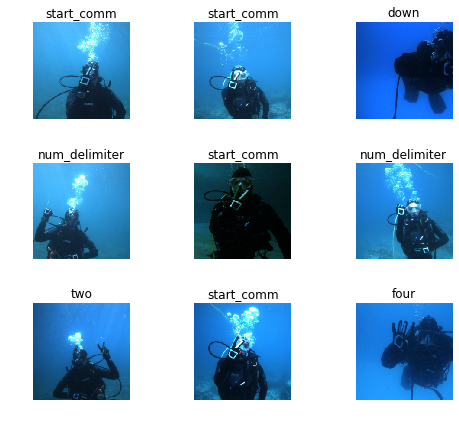

In [38]:
model_name = "resnet-50"
if model_name == "resnet-34":
    cnn_model = models.resnet34
    img_size  = 224
    epochs    = 10
    bs = 64
    # bs = 16   # uncomment this line if you run out of memory even after clicking Kernel->Restart
else:
    cnn_model = models.resnet50
    img_size  = 224
    epochs    = 10
    bs = 32
    #bs = 4   # uncomment this line if you run out of memory even after clicking Kernel->Restart

tfms = get_transforms()
data = ImageDataBunch.from_folder(split_path, bs=bs, ds_tfms=tfms, size=img_size).normalize(imagenet_stats)

data.show_batch(rows=3, figsize=(7,6))

print(f'The dataset has {len(data.classes)} ({data.c}) classes: {data.classes}')
print(f'Training   set size is: (x: {len(data.train_dl.dl.dataset.x)}, y: {len(data.train_dl.dl.dataset.y)})')
print(f'Validation set size is: (x: {len(data.valid_dl.dl.dataset.x)}, y: {len(data.valid_dl.dl.dataset.y)})')

In [39]:
print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))

learn = cnn_learner(data, cnn_model, metrics=accuracy)

print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))
print('Learner ready.')

nvidia-smi memory usage/increment: [398, 387]


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth
100%|██████████| 102502400/102502400 [00:01<00:00, 98684137.14it/s]


nvidia-smi memory usage/increment: [456, 69]
Learner ready.


three torch.Size([480, 640])


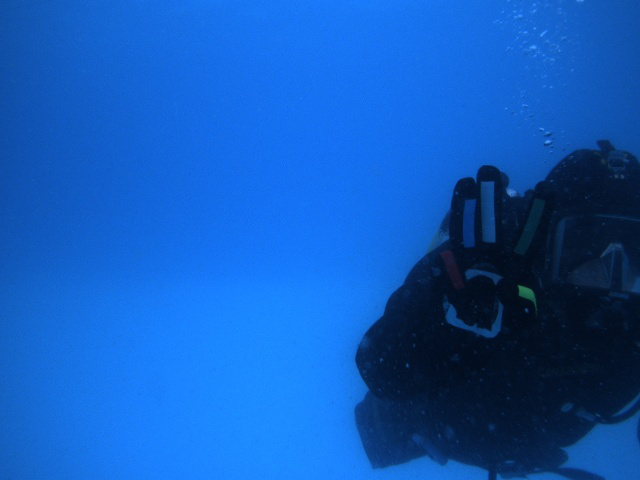

In [40]:
idx=100
img   = data.train_dl.dl.dataset.x[idx]
label = data.train_dl.dl.dataset.y[idx]
print(label, img.size)
img

three torch.Size([480, 640])


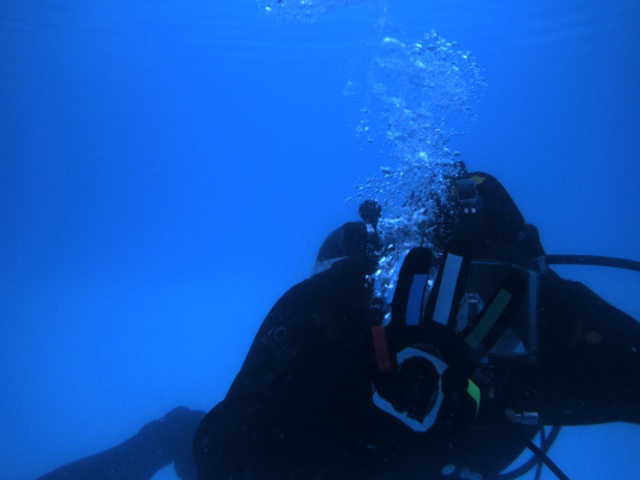

In [41]:
idx=101
img   = data.valid_dl.dl.dataset.x[idx]
label = data.valid_dl.dl.dataset.y[idx]
print(label, img.size)
img

# Training of the model with the newly created DataBunch

If you already performed these steps, go down and reload

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


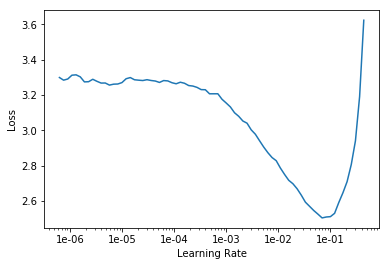

In [42]:
learn.lr_find()
learn.recorder.plot()

In [0]:
lr=1e-02

In [44]:
from fastai.callbacks import *

print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))

load_saved_model = False
savepath ='/content/'

if load_saved_model:
    print('Loading stage-1')
    #learn.load(savepath + model_name + '-stage-1')
    learn.load(savepath + 'resnet-50-stage-1-2019-07-11_16.24.10')
else:
    print(f'Training model: {model_name} for {epochs} epochs with batch size: {bs}')
    # if every=‘epoch’ the saved model filename also contains the epoch
    learn.fit_one_cycle(10, max_lr=lr, callbacks=[SaveModelCallback(learn, every='epoch', monitor='accuracy', name=savepath + model_name + '-stage-1-' + currtime)])
    learn.save(savepath + model_name + '-stage-1-' + currtime)

print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))

nvidia-smi memory usage/increment: [3649, 3580]
Training model: resnet-50 for 10 epochs with batch size: 32


epoch,train_loss,valid_loss,accuracy,time
0,0.443705,0.935239,0.728038,07:50
1,0.476713,0.983280,0.746390,07:48
2,0.403248,1.097990,0.715102,07:48
3,0.293651,0.648180,0.805957,07:47
4,0.257582,0.560401,0.835439,07:35
5,0.181274,0.317347,0.896510,07:40
6,0.126452,0.663765,0.851986,07:41
7,0.102298,0.331569,0.910951,07:51
8,0.084999,0.325003,0.915463,07:40
9,0.087498,0.322664,0.914561,07:46


nvidia-smi memory usage/increment: [3639, 59]


# Mount your Google Drive

In [45]:
from google.colab import drive
drive.mount('/content/gdrive')

savepath = Path('/content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models/')
savepath.mkdir(exist_ok=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


# Optional

Choose whether to save the learner on your Google Drive or reload from it.

In [46]:
old_path = Path('/content')
old_path_files = old_path.ls()
for file in old_path_files:
    if model_name in str(file):
        print(f'Copying saved model: {file} to {savepath}')
        shutil.copy(file, savepath)

Copying saved model: /content/resnet-50-stage-1-2019-09-16_14.21.39_0.pth to /content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models
Copying saved model: /content/resnet-50-stage-1-2019-09-16_14.21.39_6.pth to /content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models
Copying saved model: /content/resnet-50-stage-1-2019-09-16_14.21.39_1.pth to /content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models
Copying saved model: /content/resnet-50-stage-1-2019-09-16_14.21.39.pth to /content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models
Copying saved model: /content/resnet-50-stage-1-2019-09-16_14.21.39_8.pth to /content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models
Copying saved model: /content/resnet-50-stage-1-2019-09-16_14.21.39_3.pth to /content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models
Copying saved model: /content/resnet-50-stage-1-2019-09-16_14.21.39_9.pth to /content/gdrive/My Drive/Colab Notebooks/ca

In [0]:
learn.load(savepath / (model_name + '-stage-1-2019-09-12_08.23.21_8'))

Learner(data=ImageDataBunch;

Train: LabelList (4320 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-A;

Valid: LabelList (1086 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-A;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=

In [0]:
print(f'Exporting the model as pickle file to {savepath}...')
learn.export(savepath / (model_name + '-stage-1-' + currtime + '.pkl'))           # export model as pickle file to be used "outside fast.ai"

Exporting the model as pickle file to /content/gdrive/My Drive/Colab Notebooks/caddy-gestures-resnet-models...


# Evaluate the model

At first, against the validation set

Plotting top losses for stage-1


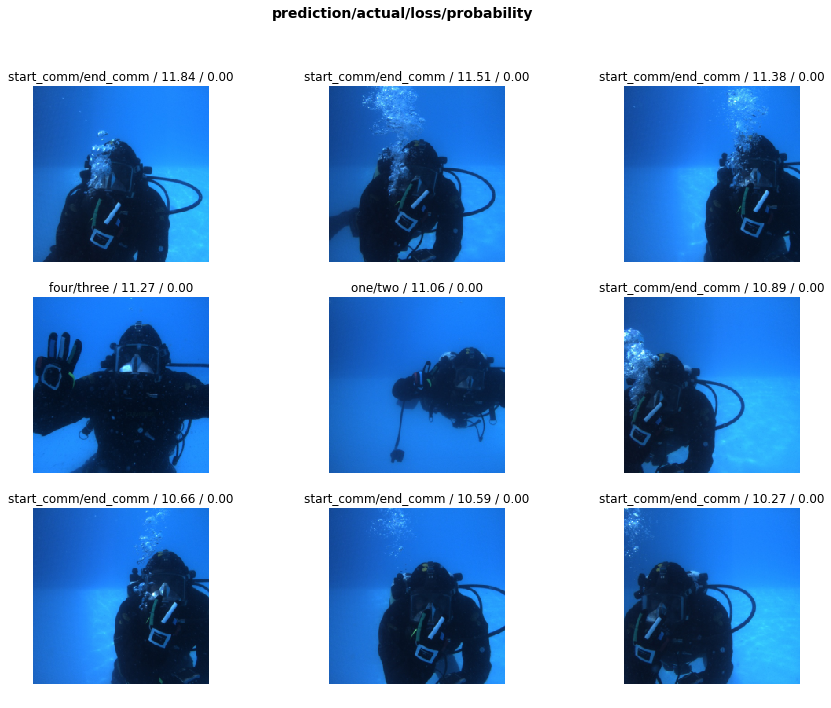

In [47]:
print('Interpreting result for stage-1')
interp = ClassificationInterpretation.from_learner(learn)
print('Plotting top losses for stage-1')
losses,idxs = interp.top_losses()
len(data.valid_ds)==len(losses)==len(idxs)
interp.plot_top_losses(9, figsize=(15,11))

Plotting confusion matrix/top confused for stage-1


[('end_comm', 'start_comm', 93),
 ('three', 'four', 59),
 ('two', 'one', 30),
 ('num_delimiter', 'end_comm', 13),
 ('num_delimiter', 'carry', 12),
 ('here', 'backwards', 9),
 ('mosaic', 'start_comm', 6),
 ('up', 'carry', 5),
 ('carry', 'up', 4),
 ('end_comm', 'carry', 3),
 ('end_comm', 'up', 3),
 ('num_delimiter', 'up', 3),
 ('one', 'two', 3),
 ('three', 'photo', 3),
 ('two', 'three', 3),
 ('down', 'one', 2),
 ('end_comm', 'num_delimiter', 2),
 ('five', 'four', 2),
 ('here', 'num_delimiter', 2),
 ('here', 'one', 2),
 ('here', 'three', 2),
 ('mosaic', 'one', 2),
 ('photo', 'one', 2),
 ('start_comm', 'num_delimiter', 2),
 ('three', 'five', 2),
 ('three', 'two', 2)]

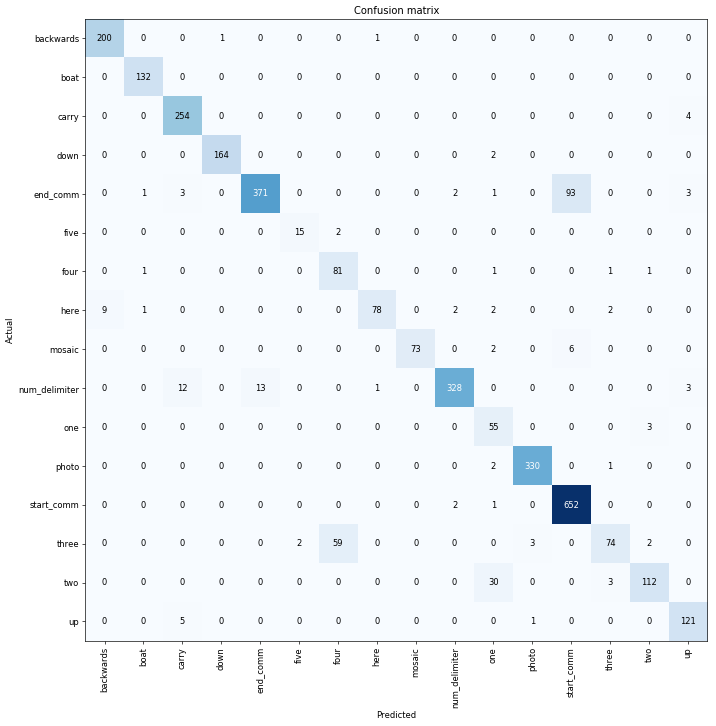

In [48]:
print('Plotting confusion matrix/top confused for stage-1')
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
interp.most_confused(min_val=2)

# Let's also do some manual number crunching

Just because I can't find a quick way to extract accuracy inside the guts of Fast.ai after a call to **```validate()```** on the test set...

In [0]:
def evaluate_model_from_interp(interp, data):
  # perform a "manual" evaluation of the model to take a look at predictions vs. labels and to
  # re-compute accuracy from scratch (to double check and also because I didn't find a quick way
  # to extract accuracy inside the guts of Fast.ai after a call to validate() on the test set...)
  print(f'Interp has {len(interp.y_true)} ground truth labels: {interp.y_true}')
  print(f'Interp yielded {len(interp.preds)} raw predictions. First two raw predictions are: {interp.preds[:2]}')
  print(f'The problem had {len(data.classes)} classes: {data.classes}') # data.c is just len(data.classes)

  print('')
  print(f'Pred -> GroundTruth = PredLabel -> GroundTruthLabel')

  ok_pred = 0

  for idx, raw_p in enumerate(interp.preds):
      pred = np.argmax(raw_p)
      if idx < 10:
          print(f'{pred} -> {interp.y_true[idx]} = {data.classes[pred]} -> {data.valid_ds.y[idx]}')
      if pred == interp.y_true[idx]:
          ok_pred += 1

  acc = ok_pred / len(interp.y_true)
  print(f'Overall accuracy of the model: {acc:0.5f}')
  return acc

In [50]:
evaluate_model_from_interp(interp, data)

Interp has 3324 ground truth labels: tensor([13, 13, 13,  ..., 11, 11, 11])
Interp yielded 3324 raw predictions. First two raw predictions are: tensor([[6.6617e-03, 3.6589e-05, 1.0884e-04, 2.0013e-04, 1.2751e-03, 1.1326e-04,
         5.1693e-02, 4.0400e-05, 1.2226e-04, 2.3220e-05, 9.4001e-04, 8.9005e-06,
         3.2078e-03, 9.2972e-01, 5.8179e-03, 2.7266e-05],
        [7.0749e-06, 8.0065e-05, 5.4093e-05, 3.4291e-05, 4.1523e-06, 3.2417e-02,
         4.6786e-03, 3.4955e-07, 1.2955e-03, 2.8675e-05, 8.5146e-06, 4.7554e-02,
         9.3208e-06, 9.1368e-01, 1.4804e-04, 2.1216e-06]])
The problem had 16 classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']

Pred -> GroundTruth = PredLabel -> GroundTruthLabel
13 -> 13 = three -> three
13 -> 13 = three -> three
6 -> 13 = four -> three
13 -> 13 = three -> three
5 -> 13 = five -> three
13 -> 13 = three -> three
13 -> 13 = three -> three
13

0.914560770156438

# Fast.ai doesn't provide an `evaluate()`-like function as in Keras

![alt text](https://i.ibb.co/86k8rFN/image.png)

So it's not possible to have a labeled test set in the same databunch used for training/validation of the model. Ok, let's follow the advice and build another databunch with training and test set (used as validation set). <spoiler> In Keras there's a handy [model.evaluate()](https://keras.io/models/model/#evaluate) function to test the model. </spoiler>

# Batch construction of 8+1 ImageDataBunch

To batch-test the model against each of them

Executing rsync -a --progress caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test
Picking up images from caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F directory...
Creating test DataBunch data_test[biograd-A]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: (x: 13267, y: 13267)
Validation set size is: (x: 351, y: 351)
Creating test DataBunch data_test[biograd-B]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: (x: 13267, y: 13267)
Validation set size is: (x: 204, y: 204)
Creating test DataBunch data_test[biograd-C]
The dataset has 16 (16) class

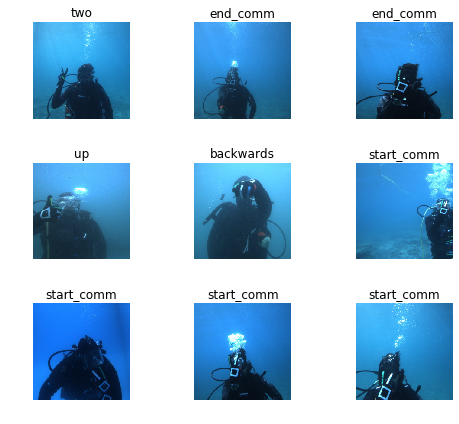

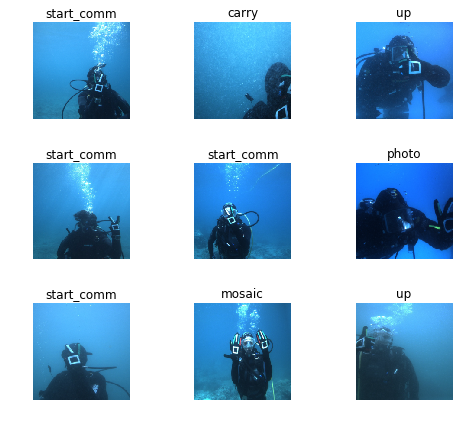

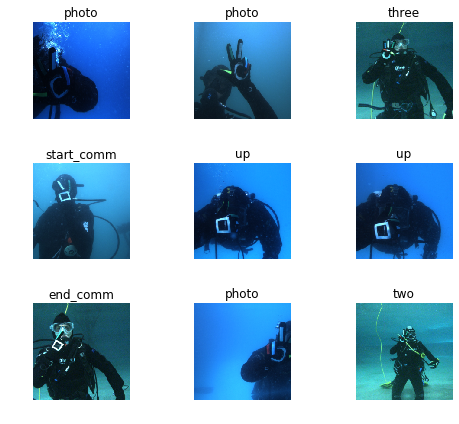

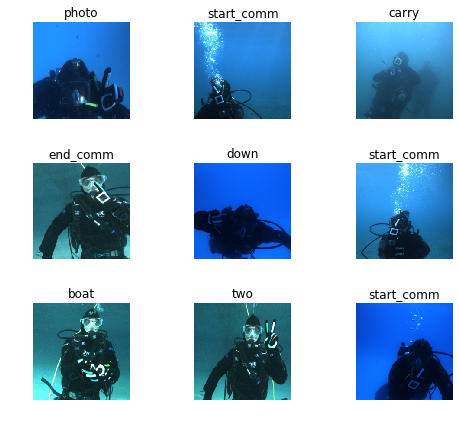

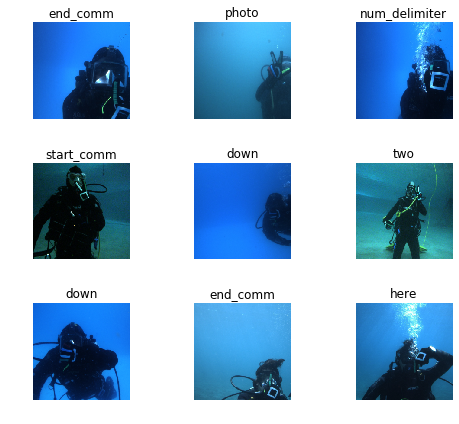

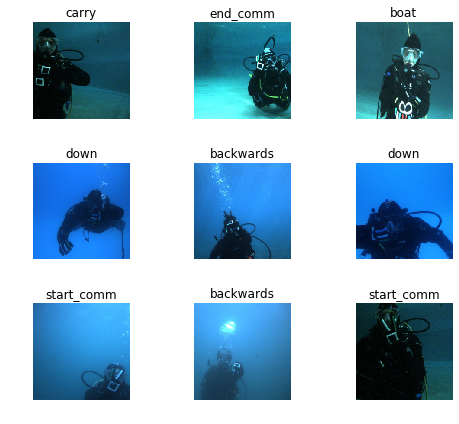

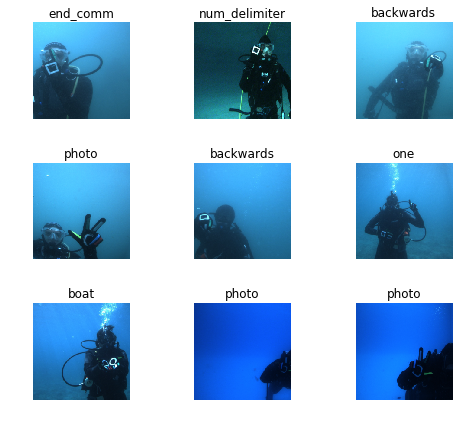

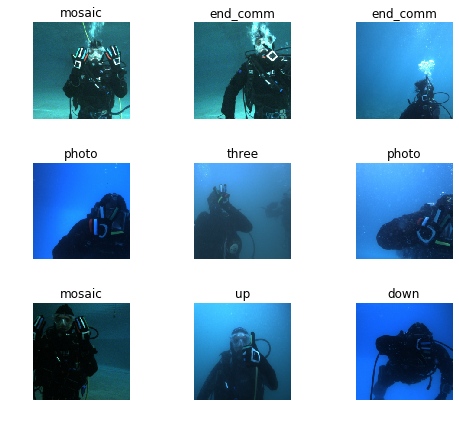

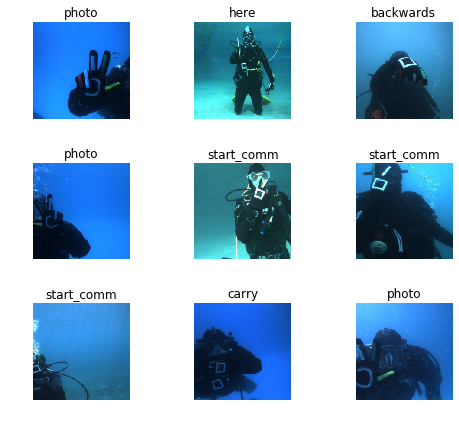

In [56]:
train_path = split_path / 'train'
test_path  = split_path / 'test'

!echo "Executing rsync -a --progress" "$train_path" "$test_path"
!rsync -a "$train_path" "$test_path"                                             # rsync the whole 'train' dir to make Fast.ai pick up the correct scenario as validation set
 
print(f'Picking up images from {split_path} directory...')

data_test = {}

tfms = get_transforms()
for sc in scenarios + ['overall']:                                               # 8+1 scenarios
    if (sc not in models_specs[curr_model]['train']) or (curr_model == 'F'):     # but skip the scenarios used to train the model
        print(f'Creating test DataBunch data_test[{sc}]')
        data_test[sc] = ImageDataBunch.from_folder(test_path, train='train', valid=sc, bs=bs, ds_tfms=tfms, size=img_size).normalize(imagenet_stats)
        
        data_t = data_test[sc]
        data_t.show_batch(rows=3, figsize=(7,6))
        
        print(f'The dataset has {len(data_t.classes)} ({data_t.c}) classes: {data_t.classes}')
        print(f'Training   set size is: (x: {len(data_t.train_dl.dl.dataset.x)}, y: {len(data_t.train_dl.dl.dataset.y)})')
        print(f'Validation set size is: (x: {len(data_t.valid_dl.dl.dataset.x)}, y: {len(data_t.valid_dl.dl.dataset.y)})')

three torch.Size([480, 640])


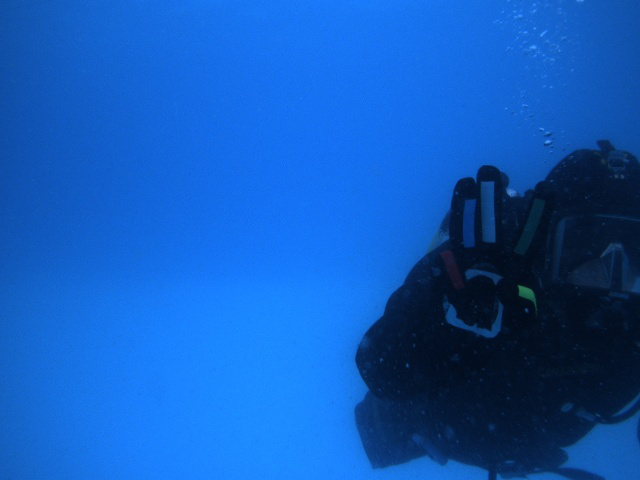

In [57]:
idx=100
img   = data_test['genova-A'].train_dl.dl.dataset.x[idx]
label = data_test['genova-A'].train_dl.dl.dataset.y[idx]
print(label, img.size)
img

carry torch.Size([480, 640])


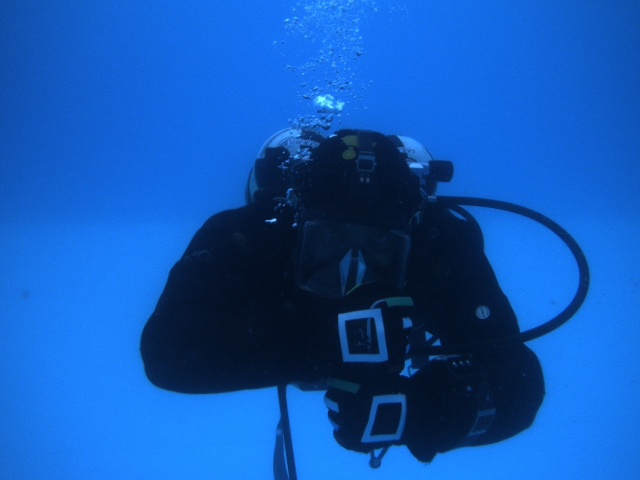

In [58]:
idx=102
img   = data_test['genova-A'].valid_dl.dl.dataset.x[idx]
label = data_test['genova-A'].valid_dl.dl.dataset.y[idx]
print(label, img.size)
img

three torch.Size([480, 640])


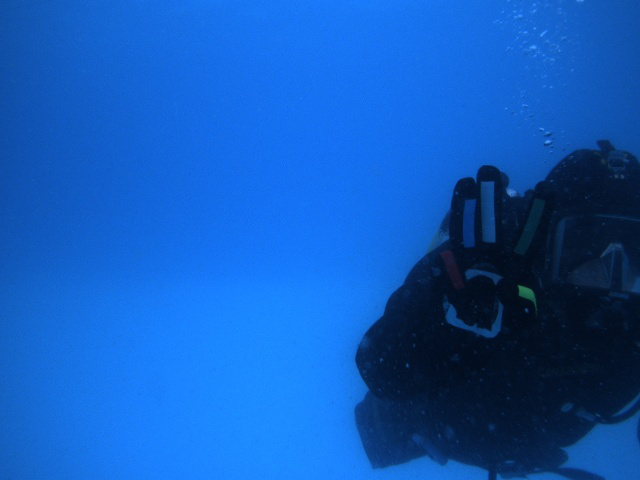

In [59]:
idx=100
img   = data_test['brodarski-A'].train_dl.dl.dataset.x[idx]
label = data_test['brodarski-A'].train_dl.dl.dataset.y[idx]
print(label, img.size)
img

here torch.Size([480, 640])


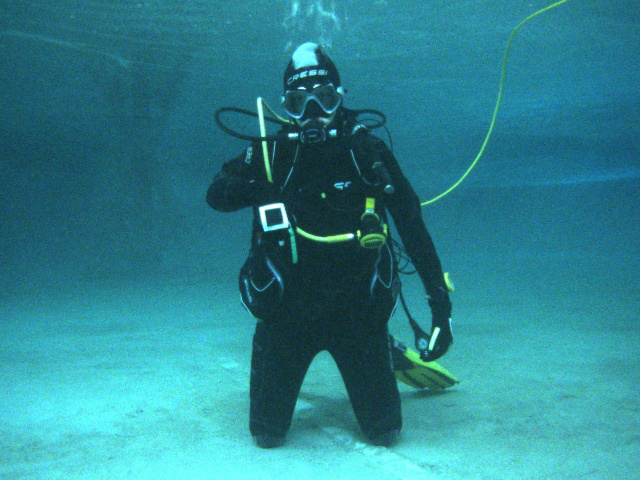

In [62]:
idx=47
img   = data_test['brodarski-A'].valid_dl.dl.dataset.x[idx]
label = data_test['brodarski-A'].valid_dl.dl.dataset.y[idx]
print(label, img.size)
img

three torch.Size([480, 640])


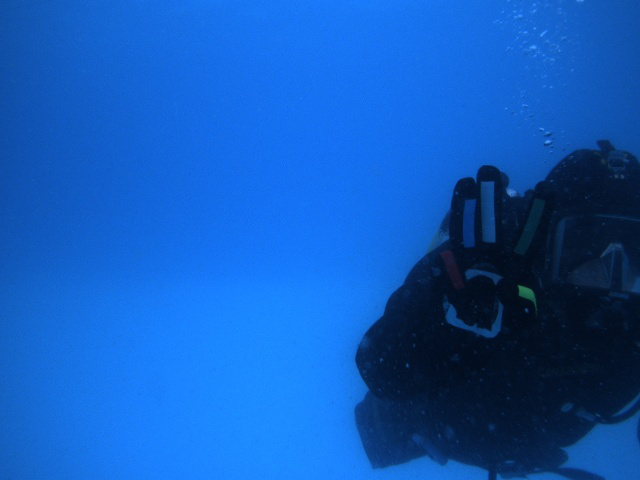

In [63]:
idx=100
img   = data_test['overall'].train_dl.dl.dataset.x[idx]
label = data_test['overall'].train_dl.dl.dataset.y[idx]
print(label, img.size)
img

backwards torch.Size([480, 640])


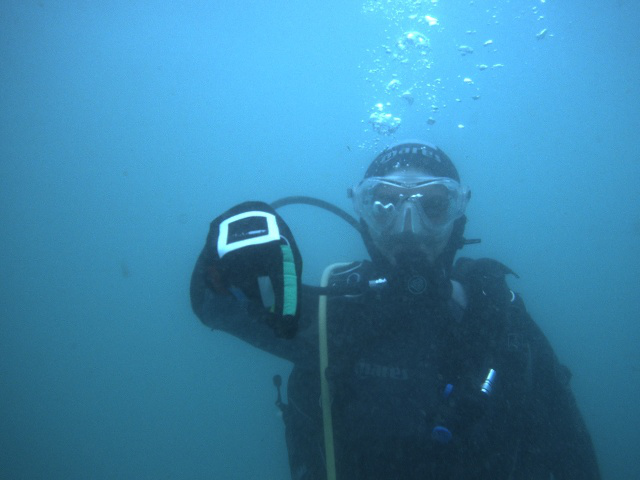

In [64]:
idx=105
img   = data_test['overall'].valid_dl.dl.dataset.x[idx]
label = data_test['overall'].valid_dl.dl.dataset.y[idx]
print(label, img.size)
img

In [65]:
print(learn.data, data, data_test)

ImageDataBunch;

Train: LabelList (13267 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F;

Valid: LabelList (3324 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F;

Test: None ImageDataBunch;

Train: LabelList (13267 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F;

Valid: LabelList (3324 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: Cat

# Let's first try the procedure on a single scenario

In [0]:
learn.data = data_test['genova-A']

In [67]:
print(learn.data, data, data_test)

ImageDataBunch;

Train: LabelList (13267 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test;

Valid: LabelList (669 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test;

Test: None ImageDataBunch;

Train: LabelList (13267 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
three,three,three,three,three
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F;

Valid: LabelList (3324 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 22

Plotting top losses for stage-1 (test set)


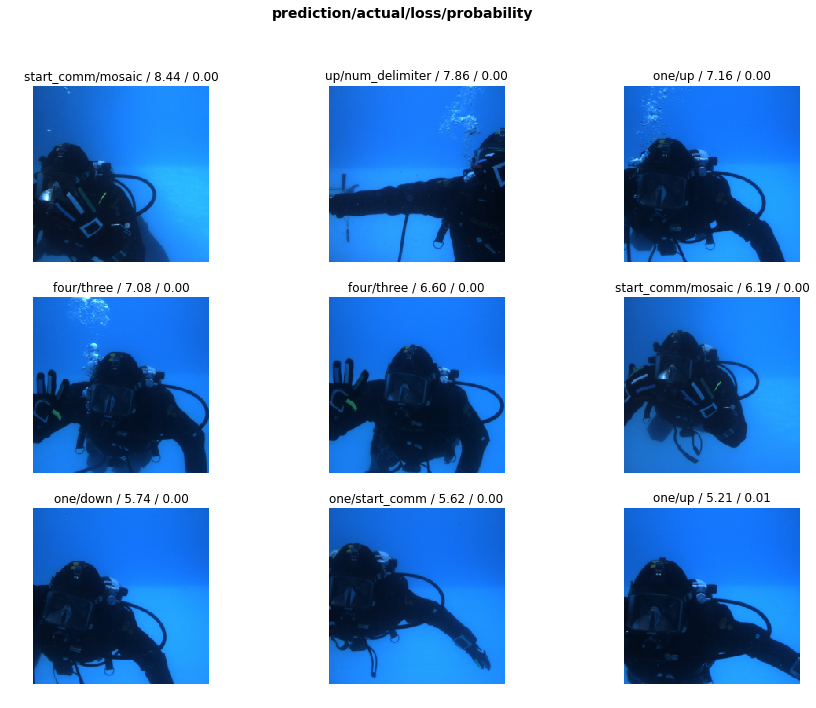

In [68]:
print('Interpreting result for stage-1 (test set)')
interp = ClassificationInterpretation.from_learner(learn)
print('Plotting top losses for stage-1 (test set)')
losses,idxs = interp.top_losses()
len(data_test['genova-A'].valid_ds)==len(losses)==len(idxs)
interp.plot_top_losses(9, figsize=(15,11))

Plotting confusion matrix/top confused for stage-1


[('down', 'one', 10),
 ('num_delimiter', 'end_comm', 7),
 ('two', 'three', 7),
 ('end_comm', 'start_comm', 6),
 ('two', 'one', 6),
 ('num_delimiter', 'carry', 5),
 ('start_comm', 'one', 5),
 ('up', 'one', 5),
 ('mosaic', 'start_comm', 4),
 ('three', 'four', 4),
 ('here', 'backwards', 2),
 ('num_delimiter', 'photo', 2),
 ('num_delimiter', 'up', 2)]

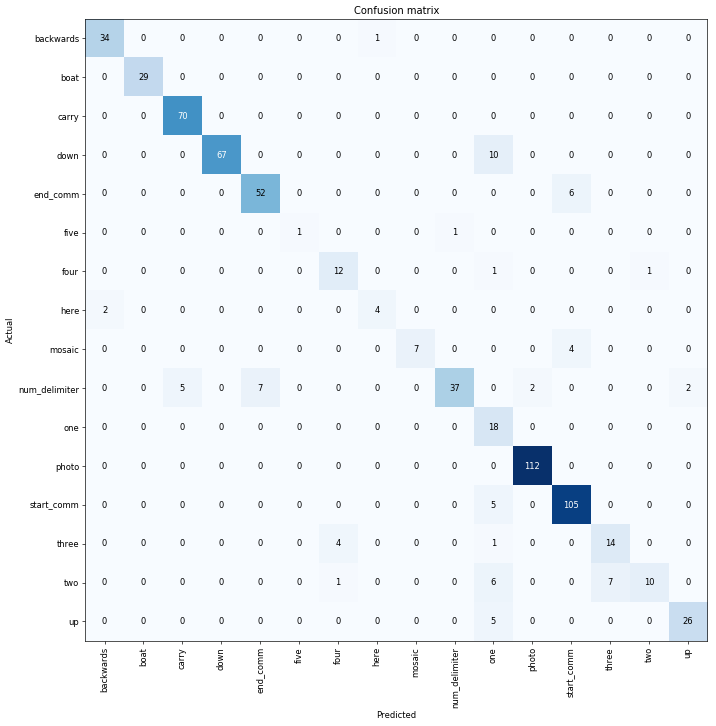

In [69]:
print('Plotting confusion matrix/top confused for stage-1')
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
interp.most_confused(min_val=2)

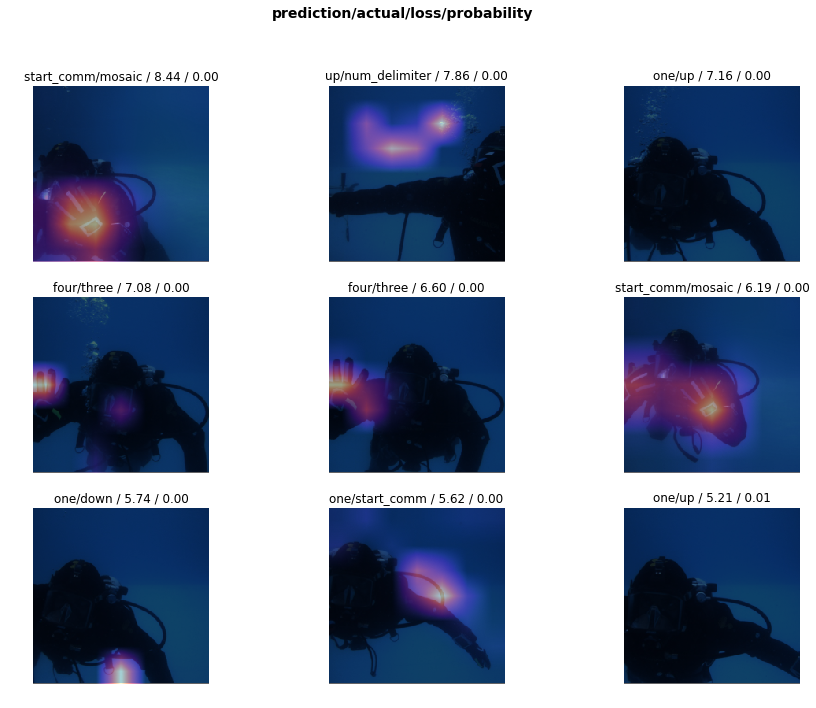

In [70]:
interp.plot_top_losses(9, figsize=(15,11), heatmap=True)

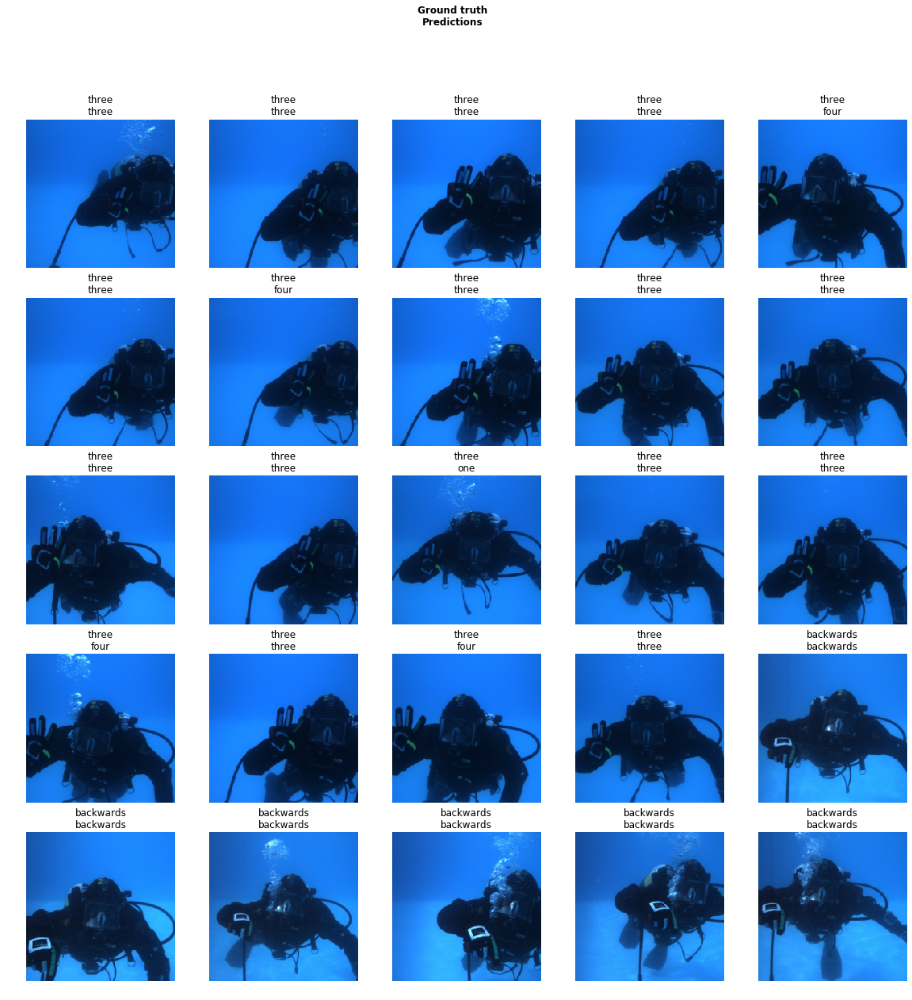

In [71]:
learn.show_results()

In [72]:
evaluate_model_from_interp(interp, data)

Interp has 669 ground truth labels: tensor([13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13,
        13,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
         1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14,
        14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14,  3,  3,  3,  3,  3,  3,  3,
         3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
    

0.8938714499252616

# Now, let's do it again in "batch mode" for all the test scenarios

In [74]:
accuracies = {}
accuracies[curr_model] = {}

for sc in scenarios + ['overall']:
    if (sc not in models_specs[curr_model]['train']) or curr_model == 'F':
      
        print(80*'-')
        print(80*'-')
        print(80*'-')

        print(f'Selecting the test DataBunch data_test[{sc}]')
        
        data_t = data_test[sc]
        
        print(f'The dataset has {len(data_t.classes)} ({data_t.c}) classes: {data_t.classes}')
        print(f'Training   set size is: (x: {len(data_t.train_dl.dl.dataset.x)}, y: {len(data_t.train_dl.dl.dataset.y)})')
        print(f'Validation set size is: (x: {len(data_t.valid_dl.dl.dataset.x)}, y: {len(data_t.valid_dl.dl.dataset.y)})')
        
        learn.data = data_t
        
        print(f'Interpreting results for model-{curr_model} (test set) on scenario {sc}')
        interp = ClassificationInterpretation.from_learner(learn)
        losses,idxs = interp.top_losses()
        #interp.plot_top_losses(9, figsize=(15,11))
        
        print('Plotting confusion matrix/top confused for stage-1')
        #interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
        interp.most_confused(min_val=2)
        
        accuracies[curr_model][sc] = evaluate_model_from_interp(interp, data_t)

        print(f'End of testing for model-{curr_model} against test DataBunch {sc}')

        print(80*'-')
        print(80*'-')
        print(80*'-')


Plotting confusion matrix/top confused for stage-1
Interp has 1887 ground truth labels: tensor([13, 13, 13,  ..., 11, 11, 11])
Interp yielded 1887 raw predictions. First two raw predictions are: tensor([[2.4533e-08, 4.3099e-09, 1.7470e-07, 2.5599e-07, 1.7990e-08, 3.4482e-08,
         2.2534e-07, 2.7942e-07, 5.9530e-04, 4.9958e-07, 1.6080e-06, 1.1929e-07,
         4.5669e-08, 9.9933e-01, 7.4584e-05, 1.2413e-08],
        [9.0793e-09, 6.6151e-09, 2.4607e-09, 1.3807e-07, 2.7360e-09, 1.2726e-07,
         4.9596e-07, 2.3053e-08, 9.7165e-06, 3.1887e-07, 2.3812e-06, 7.1193e-07,
         2.3960e-08, 9.9948e-01, 5.0602e-04, 1.7942e-09]])
The problem had 16 classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']

Pred -> GroundTruth = PredLabel -> GroundTruthLabel
13 -> 13 = three -> three
13 -> 13 = three -> three
13 -> 13 = three -> three
13 -> 13 = three -> three
13 -> 13 = three -> three

In [76]:
for sc in scenarios + ['overall']:
    if (sc not in models_specs[curr_model]['train']) or curr_model == 'F':
        print(f'Accuracy for model-{curr_model} tested against scenario {sc}: {accuracies[curr_model][sc]:0.5f}')
        
accuracies_df = pd.DataFrame.from_dict(accuracies)

print(accuracies_df)
accuracies_df.to_csv('/content/accuracies-df-model-' + curr_model + '.csv')

Accuracy for model-F tested against scenario biograd-A: 0.99430
Accuracy for model-F tested against scenario biograd-B: 0.99510
Accuracy for model-F tested against scenario biograd-C: 0.97268
Accuracy for model-F tested against scenario genova-A: 0.89387
Accuracy for model-F tested against scenario brodarski-A: 0.95833
Accuracy for model-F tested against scenario brodarski-B: 0.86364
Accuracy for model-F tested against scenario brodarski-C: 0.98742
Accuracy for model-F tested against scenario brodarski-D: 1.00000
Accuracy for model-F tested against scenario overall: 0.95178
                    F
biograd-A    0.994302
biograd-B    0.995098
biograd-C    0.972678
brodarski-A  0.958333
brodarski-B  0.863636
brodarski-C  0.987421
brodarski-D  1.000000
genova-A     0.893871
overall      0.951775
